#Augmentasi Data

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import albumentations as A
from albumentations.pytorch import ToTensorV2
import cv2
import os
import numpy as np
import torch

# Fungsi untuk augmentasi gambar
def augment_image(image, augmenter):
    augmented = augmenter(image=image)
    return augmented['image']

# Membuat pipeline augmentasi
augmenter = A.Compose([
    A.HorizontalFlip(p=0.5),  # Flip horizontal dengan probabilitas 50%
    A.VerticalFlip(p=0.5),    # Flip vertikal dengan probabilitas 50%
    A.HueSaturationValue(hue_shift_limit=20, sat_shift_limit=30, val_shift_limit=20, p=0.5),
    A.RGBShift(r_shift_limit=20, g_shift_limit=20, b_shift_limit=20, p=0.5),
    A.RandomBrightnessContrast(p=0.2),  # Ubah kecerahan dan kontras secara random
    #A.ShiftScaleRotate(shift_limit=0, scale_limit=0, rotate_limit=360, p=0.25),  # Geser, skalakan, atau rotasi
    A.GaussianBlur(blur_limit=(3, 7), p=0.2),  # Blur secara random
    ToTensorV2()  # Konversi ke format tensor untuk PyTorch
])

# Path ke folder gambar
input_folder = '/content/drive/MyDrive/Capstone/data/crop'  # Folder dengan gambar asli
output_folder = '/content/drive/MyDrive/Capstone/data/crop'  # Folder untuk menyimpan gambar augmentasi
os.makedirs(output_folder, exist_ok=True)

# Augmentasi gambar dari folder input
for filename in os.listdir(input_folder):
    if filename.endswith(('.jpg', '.png', '.jpeg')):  # Hanya proses file gambar
        # Membaca gambar
        image_path = os.path.join(input_folder, filename)
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Konversi ke format RGB

        # Buat beberapa augmentasi dari satu gambar
        for i in range(2):  # Misal, buat 5 gambar augmentasi per gambar asli
            augmented_image = augment_image(image, augmenter)

            # Konversi kembali ke format BGR untuk menyimpan dengan OpenCV
            augmented_image = augmented_image.permute(1, 2, 0).cpu().numpy()  # Tensor ke numpy
            augmented_image = (augmented_image).astype(np.uint8)  # Denormalisasi
            augmented_image = cv2.cvtColor(augmented_image, cv2.COLOR_RGB2BGR)

            # Simpan gambar augmentasi
            output_filename = f"{os.path.splitext(filename)[0]}_augmented_{i+1}.jpg"
            output_path = os.path.join(output_folder, output_filename)
            cv2.imwrite(output_path, augmented_image)


# Albumentasi

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os
import cv2
import numpy as np
from albumentations import (
    Compose, HorizontalFlip, VerticalFlip, Blur, RandomBrightnessContrast, HueSaturationValue
)
from pathlib import Path
import random

# Path folder data
data_dir = Path('/content/drive/MyDrive/Capstone/cnn_crop_again/val')
images_dir = data_dir / "crop"
augmented_images_dir = data_dir / "crop"

# Membuat folder output jika belum ada
os.makedirs(augmented_images_dir, exist_ok=True)

# Definisikan pipeline augmentasi
augmentation_pipeline = Compose([
    HorizontalFlip(p=0.5),
    VerticalFlip(p=0.5),
    RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2, p=0.5),
    HueSaturationValue(hue_shift_limit=20, sat_shift_limit=30, val_shift_limit=20, p=0.5),
    Blur(blur_limit=3, p=0.2),
])

# Fungsi untuk rotasi 90°, 180°, atau 270°
def rotate_image(image):
    # Pilih rotasi secara acak antara 90°, 180°, atau 270°
    angle = random.choice([90, 180, 270])

    if angle == 90:
        image = cv2.transpose(image)
        image = cv2.flip(image, flipCode=1)  # 90° clockwise
    elif angle == 180:
        image = cv2.flip(image, flipCode=-1)  # 180° clockwise
    elif angle == 270:
        image = cv2.transpose(image)
        image = cv2.flip(image, flipCode=0)  # 270° clockwise

    return image

# Fungsi untuk melakukan augmentasi pada gambar
def apply_augmentation(image_filepath):
    # Membaca gambar
    image = cv2.imread(str(image_filepath))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Lakukan augmentasi pertama (flip, brightness, saturasi, dll)
    augmented = augmentation_pipeline(image=image)
    augmented_image1 = augmented['image']

    # Lakukan rotasi pada gambar pertama
    augmented_image1 = rotate_image(augmented_image1)

    # Mengubah nama file hasil augmentasi pertama
    augmented_image_filename1 = image_filepath.stem + "_aug1.jpg"
    augmented_image_filepath1 = augmented_images_dir / augmented_image_filename1

    # Mengonversi gambar kembali ke format BGR untuk disimpan dengan OpenCV
    augmented_image1 = cv2.cvtColor(augmented_image1, cv2.COLOR_RGB2BGR)
    cv2.imwrite(str(augmented_image_filepath1), augmented_image1)

    # Lakukan augmentasi kedua (flip, brightness, saturasi, dll)
    augmented = augmentation_pipeline(image=image)
    augmented_image2 = augmented['image']

    # Lakukan rotasi pada gambar kedua
    augmented_image2 = rotate_image(augmented_image2)

    # Mengubah nama file hasil augmentasi kedua
    augmented_image_filename2 = image_filepath.stem + "_aug2.jpg"
    augmented_image_filepath2 = augmented_images_dir / augmented_image_filename2

    # Mengonversi gambar kembali ke format BGR untuk disimpan dengan OpenCV
    augmented_image2 = cv2.cvtColor(augmented_image2, cv2.COLOR_RGB2BGR)
    cv2.imwrite(str(augmented_image_filepath2), augmented_image2)

# Loop untuk augmentasi gambar
for image_filename in os.listdir(images_dir):
    if image_filename.endswith(".jpg"):
        image_filepath = images_dir / image_filename
        apply_augmentation(image_filepath)

print("Proses augmentasi selesai.")


Proses augmentasi selesai.


# Crop FIX

In [ ]:
!pip install tensorflow

In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Direktori dataset
train_dir = '/content/drive/MyDrive/Capstone/cnn_crop_again/train'
test_dir = '/content/drive/MyDrive/Capstone/cnn_crop_again/val'

train_dataset = tf.keras.utils.image_dataset_from_directory(
    train_dir,
    image_size=(224, 224),  # Ukuran gambar
    batch_size=32  # Ukuran batch
)

validation_dataset = tf.keras.utils.image_dataset_from_directory(
    test_dir,
    image_size=(224, 224),  # Ukuran gambar
    batch_size=32  # Ukuran batch
)


Found 538 files belonging to 2 classes.
Found 116 files belonging to 2 classes.


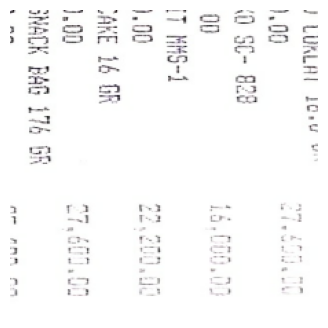

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

plt.figure(figsize=(4, 4))
dataset_iterator = train_dataset.as_numpy_iterator()  # Convert to iterator
x_train, y_train = next(dataset_iterator)  # Get next batch
image = x_train[np.random.choice(range(x_train.shape[0]))]
plt.imshow(image.astype("uint8"))
plt.axis("off")
plt.show()


In [ ]:
import tensorflow as tf

model = tf.keras.Sequential([
    # Input layer dengan normalisasi gambar
    tf.keras.Input(shape=(224, 224, 3)),
    tf.keras.layers.Rescaling(1.0 / 255),  # Normalisasi gambar ke range [0, 1]

    # Lapisan konvolusi dan pooling
    tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2, 2),

    tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2, 2),

    # Flatten untuk melanjutkan ke lapisan fully connected
    tf.keras.layers.Flatten(),

    # Fully connected layer dengan regularisasi L2
    #tf.keras.layers.Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.L2(0.01)),
    tf.keras.layers.Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.L2(0.01)),

    # Dropout layer untuk mengurangi overfitting
    tf.keras.layers.Dropout(0.5),  # Mematikan 50% neuron di lapisan ini

    # Output layer untuk 2 kelas: valid dan blur
    tf.keras.layers.Dense(1, activation='sigmoid')
])

model.compile(
    optimizer=Adam(learning_rate=0.001),  # Atur learning rate
    loss='binary_crossentropy',          # Karena klasifikasi biner
    metrics=['accuracy']
)

model.summary()


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ rescaling_1 (Rescaling)              │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 222, 222, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 111, 111, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 109, 109, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 186624)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 256)                 │      47,776,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 1)                   │             257 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 47,814,977 (182.40 MB)

 Trainable params: 47,814,977 (182.40 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
history = model.fit(
    train_dataset,
    epochs=10,
    validation_data=validation_dataset,
)

Epoch 1/10
17/17 ━━━━━━━━━━━━━━━━━━━━ 25s 954ms/step - accuracy: 0.5994 - loss: 8.6630 - val_accuracy: 0.6293 - val_loss: 2.7671
Epoch 2/10
17/17 ━━━━━━━━━━━━━━━━━━━━ 26s 474ms/step - accuracy: 0.7815 - loss: 2.6340 - val_accuracy: 0.9138 - val_loss: 1.5228
Epoch 3/10
17/17 ━━━━━━━━━━━━━━━━━━━━ 9s 546ms/step - accuracy: 0.9265 - loss: 1.2955 - val_accuracy: 0.8879 - val_loss: 0.9614
Epoch 4/10
17/17 ━━━━━━━━━━━━━━━━━━━━ 8s 426ms/step - accuracy: 0.9142 - loss: 0.8628 - val_accuracy: 0.9310 - val_loss: 0.6229
Epoch 5/10
17/17 ━━━━━━━━━━━━━━━━━━━━ 11s 476ms/step - accuracy: 0.9584 - loss: 0.5542 - val_accuracy: 0.9483 - val_loss: 0.4327
Epoch 6/10
17/17 ━━━━━━━━━━━━━━━━━━━━ 12s 602ms/step - accuracy: 0.9517 - loss: 0.4287 - val_accuracy: 0.9397 - val_loss: 0.3754
Epoch 7/10
17/17 ━━━━━━━━━━━━━━━━━━━━ 11s 635ms/step - accuracy: 0.9684 - loss: 0.3270 - val_accuracy: 0.9397 - val_loss: 0.3104
Epoch 8/10
17/17 ━━━━━━━━━━━━━━━━━━━━ 8s 464ms/step - accuracy: 0.9559 - loss: 0.2927 - val_accurac

In [ ]:
# Mengevaluasi model pada data pengujian
test_loss, test_acc = model.evaluate(validation_dataset)
print(f"Test Accuracy: {test_acc}")
print(f"Test Loss: {test_loss}")


4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 346ms/step - accuracy: 0.9820 - loss: 0.2300
Test Accuracy: 0.9655172228813171
Test Loss: 0.23348791897296906


In [ ]:
# Menyimpan model ke file .h5
model.save('/content/drive/MyDrive/Capstone/model_cnn_cropbanyak_again.h5')


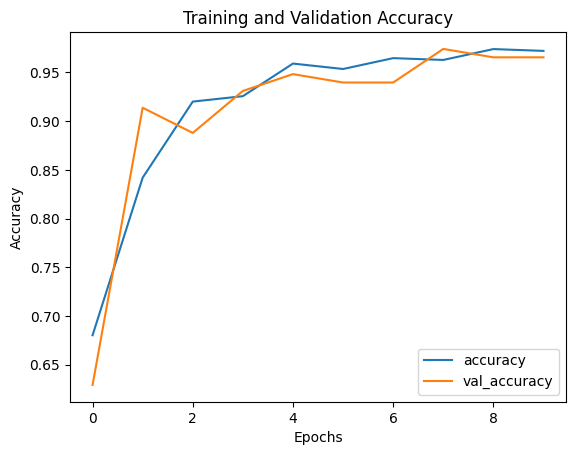

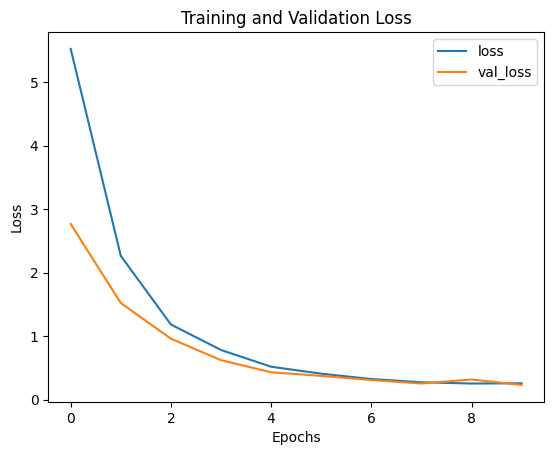

In [ ]:
import matplotlib.pyplot as plt

# Plot akurasi pelatihan dan validasi
plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label = 'val_accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')
plt.show()

# Plot kehilangan pelatihan dan validasi
plt.plot(history.history['loss'], label='loss')
plt.plot(history.history['val_loss'], label = 'val_loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()


Found 116 images belonging to 2 classes.


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 307ms/step


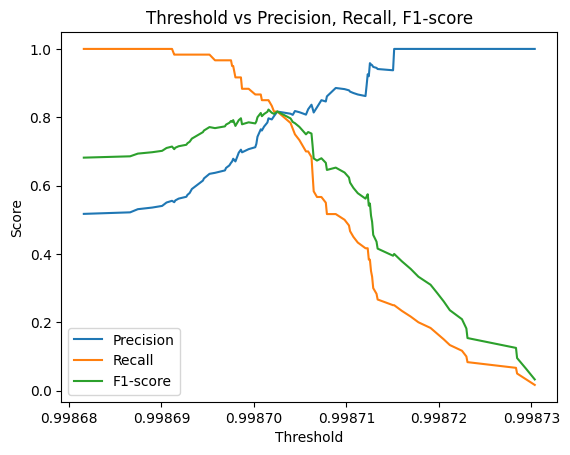

Optimal threshold: 0.9987015724182129


In [ ]:
#Mencari Optimal Threshold
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import numpy as np
from sklearn.metrics import precision_recall_curve
import matplotlib.pyplot as plt


# Memuat model yang sudah dilatih (sesuaikan dengan path model Anda)
model = load_model('/content/drive/MyDrive/Capstone/model_cnn_cropbanyak_again.h5')  # Gantilah dengan path model Anda

# Definisikan ImageDataGenerator untuk memuat dataset validasi
datagen = ImageDataGenerator(rescale=1./255)

validation_generator = datagen.flow_from_directory(
    '/content/drive/MyDrive/Capstone/cnn_crop_again/val',
    target_size=(224, 224),  # Sesuaikan dengan ukuran input model
    batch_size=32,
    class_mode='binary',  # Pastikan ini sesuai dengan jenis klasifikasi (binary)
    shuffle=False)  # Agar urutan prediksi dan label tetap sesuai

# Mendapatkan label sebenarnya (y_true)
y_true = validation_generator.classes  # Ini adalah label asli dari dataset

# Mendapatkan prediksi probabilitas
predictions = model.predict(validation_generator, verbose=1)

# Menghitung precision, recall, dan thresholds
precision, recall, thresholds = precision_recall_curve(y_true, predictions)

# Menghitung F1-score untuk setiap threshold
f1_scores = 2 * (precision * recall) / (precision + recall)

# Menampilkan hasil
plt.plot(thresholds, precision[:-1], label='Precision')
plt.plot(thresholds, recall[:-1], label='Recall')
plt.plot(thresholds, f1_scores[:-1], label='F1-score')
plt.xlabel('Threshold')
plt.ylabel('Score')
plt.legend()
plt.title('Threshold vs Precision, Recall, F1-score')
plt.show()

# Cari threshold dengan F1-score terbaik
best_threshold = thresholds[np.argmax(f1_scores)]
print(f'Optimal threshold: {best_threshold}')

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing import image
import numpy as np
import os

# Memuat model yang telah disimpan
model = tf.keras.models.load_model('/content/drive/MyDrive/Capstone/model_cnn_cropbanyak_again.h5')

# Fungsi untuk memuat dan memproses gambar baru
def load_and_preprocess_image(img_path):
    # Memuat gambar dan mengubah ukurannya sesuai dengan ukuran input model
    img = image.load_img(img_path, target_size=(224, 224))

    # Mengubah gambar menjadi array
    img_array = image.img_to_array(img)

    # Menambahkan dimensi batch
    img_array = np.expand_dims(img_array, axis=0)

    # Normalisasi gambar ke rentang [0, 1]
    img_array = img_array / 255.0

    return img_array

# Fungsi untuk melakukan prediksi
def predict_image_class(img_path):
    img_array = load_and_preprocess_image(img_path)

    # Melakukan prediksi
    predictions = model.predict(img_array)

    # Mengonversi probabilitas
    predicted_class = (predictions < 0.998701572 ).astype("int32")

    # Menampilkan hasil prediksi
    if predicted_class == 0:
        print(f"The image is classified as 'Valid'.")
    else:
        print(f"The image is classified as 'Crop'.")
    print(predictions)

# Path ke gambar yang ingin diuji
#img_path = '/content/drive/MyDrive/Capstone/data_testing/valid/valid 2.jpg'  # Ganti dengan path gambar Anda yang ingin diuji

# Melakukan prediksi
#predict_image_class(img_path)

Testing image: valid 1.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
The image is classified as 'Valid'.
[[0.9987031]]


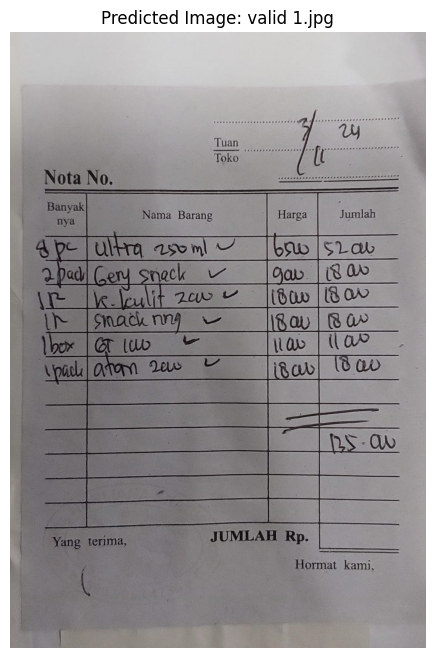

Testing image: valid 2.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
The image is classified as 'Crop'.
[[0.9987006]]


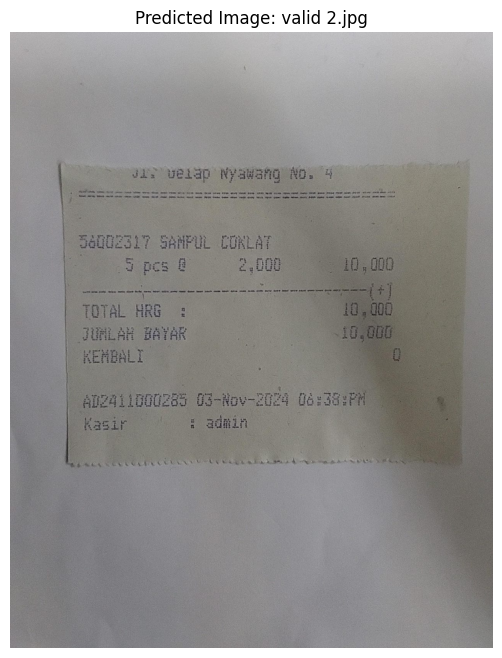

Testing image: WhatsApp Image 2024-11-30 at 14.03.04.jpeg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
The image is classified as 'Valid'.
[[0.9987262]]


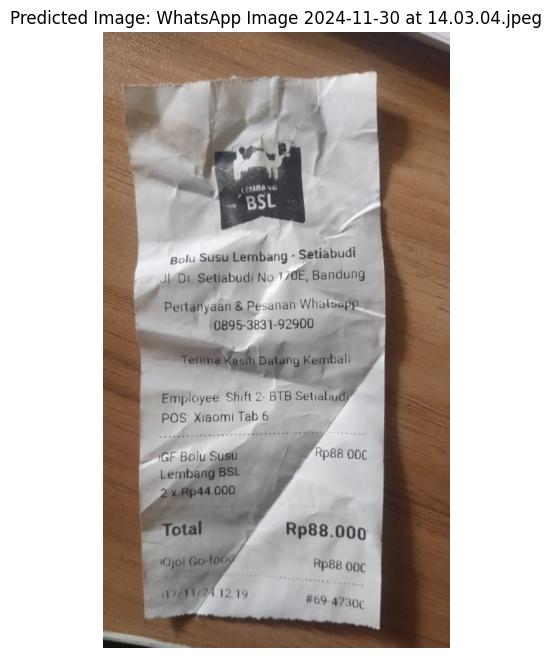

Testing image: WhatsApp Image 2024-11-30 at 14.03.05.jpeg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
The image is classified as 'Valid'.
[[0.99872416]]


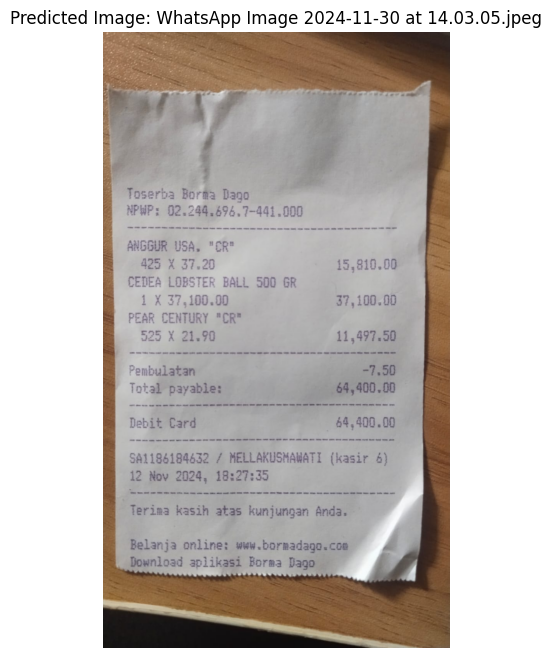

Testing image: WhatsApp Image 2024-11-30 at 14.03.12.jpeg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
The image is classified as 'Valid'.
[[0.9987257]]


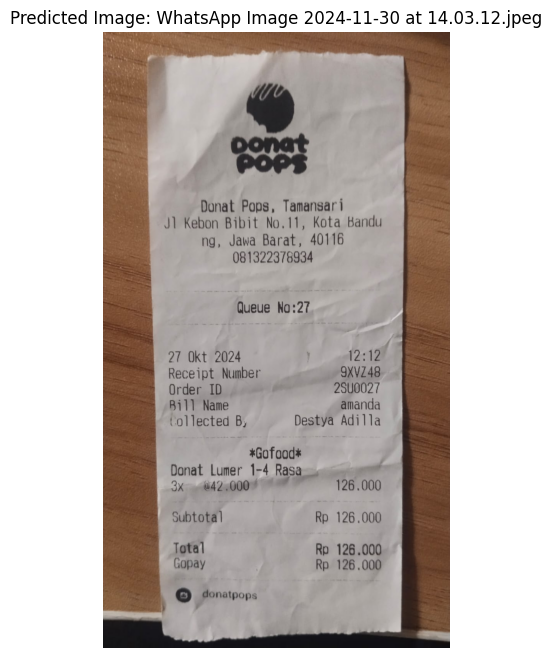

Testing image: WhatsApp Image 2024-11-30 at 14.03.23.jpeg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
The image is classified as 'Crop'.
[[0.99868613]]


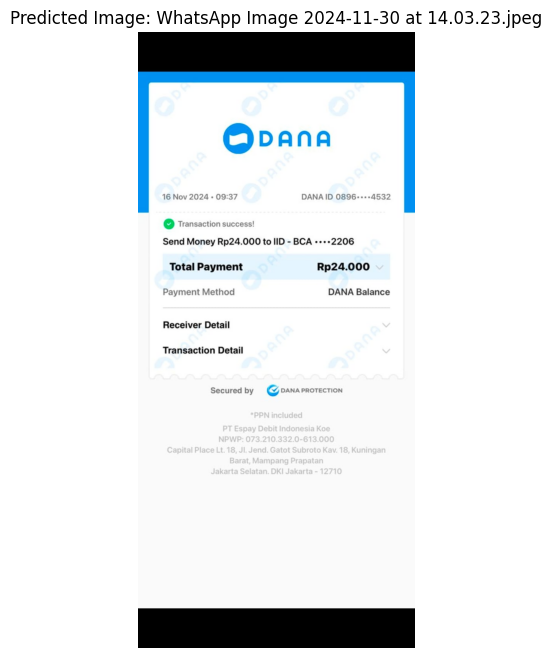

Testing image: WhatsApp Image 2024-12-02 at 23.58.34.jpeg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
The image is classified as 'Valid'.
[[0.99873704]]


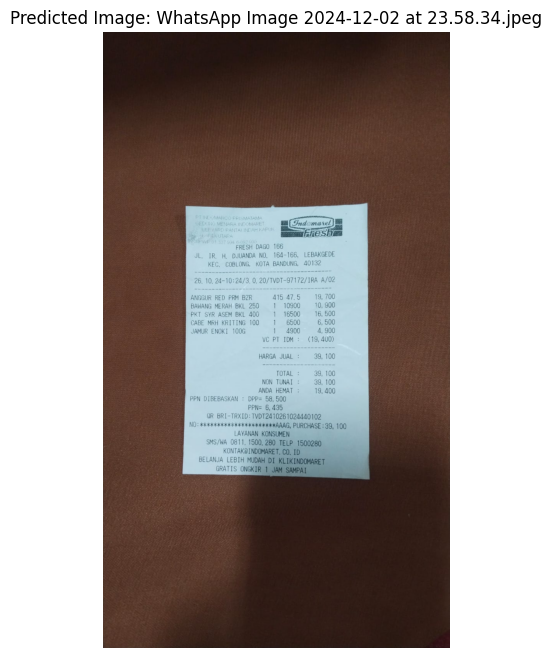

Testing image: WhatsApp Image 2024-12-02 at 23.58.34 (2).jpeg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
The image is classified as 'Valid'.
[[0.9987287]]


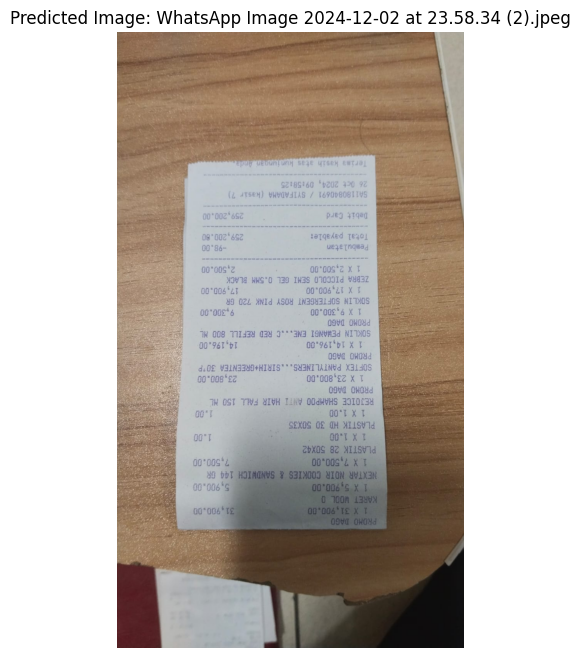

Testing image: WhatsApp Image 2024-12-02 at 23.58.34 (1).jpeg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
The image is classified as 'Valid'.
[[0.99875295]]


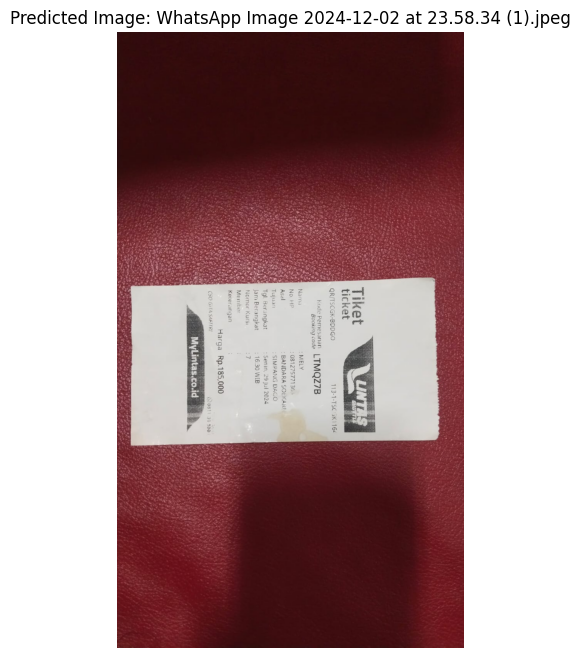

Testing image: WhatsApp Image 2024-12-02 at 23.58.35.jpeg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
The image is classified as 'Valid'.
[[0.9987614]]


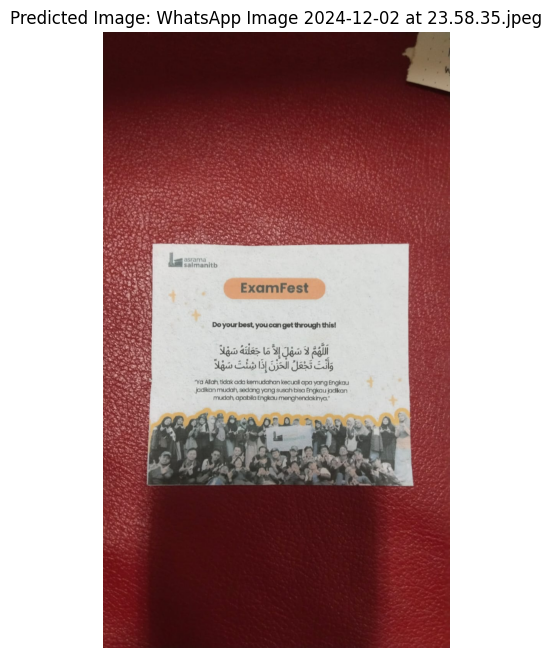

Testing image: WhatsApp Image 2024-12-02 at 23.58.35 (1).jpeg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
The image is classified as 'Valid'.
[[0.99872005]]


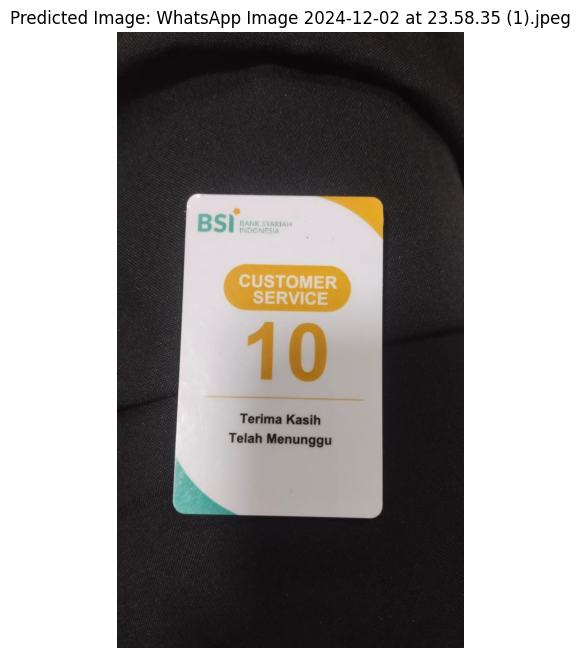

In [ ]:
import os
import cv2
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
import numpy as np

#TESTING MULTIPLE IMAGES
# Fungsi untuk menguji semua gambar dalam folder

def test_and_display_images_in_folder(folder_path):
    for filename in os.listdir(folder_path):
        if filename.endswith(('.jpg', '.png', '.jpeg')):  # Pastikan hanya memproses file gambar
            img_path = os.path.join(folder_path, filename)
            print(f"Testing image: {filename}")
            predict_image_class(img_path)

            # Membaca gambar
            image = cv2.imread(img_path)
            image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Mengonversi ke RGB untuk tampilan yang benar

            # Tampilkan gambar menggunakan matplotlib
            plt.figure(figsize=(8, 8))
            plt.imshow(image_rgb)
            plt.title(f"Predicted Image: {os.path.basename(img_path)}")  # Judul gambar dengan nama file
            plt.axis('off')  # Menyembunyikan axis
            plt.show()

# Folder tempat gambar yang ingin diuji
test_folder = '/content/drive/MyDrive/Capstone/data_testing/valid'  #kontras kertas dgn background
#test_folder = '/content/drive/MyDrive/Capstone/data_testing/crop'  #terang dan sama warna keseluruhannya
# Melakukan testing pada semua gambar dalam folder
test_and_display_images_in_folder(test_folder)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


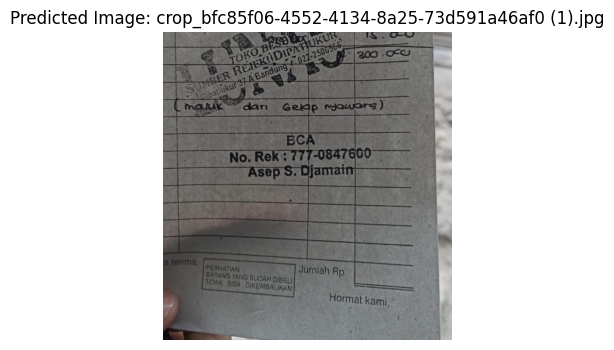

Predicted Class: [[1]]
[[0.9987093]]


In [ ]:
from tensorflow.keras.preprocessing import image
import numpy as np

# Membaca gambar baru
img_path = '/content/drive/MyDrive/Capstone/Cropped/crop_bfc85f06-4552-4134-8a25-73d591a46af0 (1).jpg'  # Ganti dengan path gambar Anda
img = image.load_img(img_path, target_size=(224, 224))

# Mengubah gambar menjadi array
img_array = image.img_to_array(img)

# Menambahkan dimensi batch
img_array = np.expand_dims(img_array, axis=0)

# Normalisasi gambar
img_array = img_array / 255.0

# Melakukan prediksi
predictions = model.predict(img_array)
#predicted_class = np.argmax(predictions, axis=1)
predicted_class = (predictions > 0.5).astype("int32")

image = cv2.imread(img_path)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Mengonversi ke RGB untuk tampilan yang benar
plt.figure(figsize=(4, 4))
plt.imshow(image_rgb)
plt.title(f"Predicted Image: {os.path.basename(img_path)}")  # Judul gambar dengan nama file
plt.axis('off')  # Menyembunyikan axis
plt.show()


# Menampilkan kelas yang diprediksi
print(f"Predicted Class: {predicted_class}")
print(predictions)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


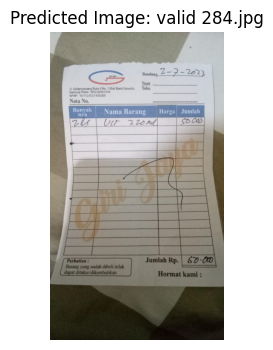

Predicted Class: [[1]]
[[0.99806935]]


In [ ]:
from tensorflow.keras.preprocessing import image
import numpy as np

# Membaca gambar baru
img_path = '/content/drive/MyDrive/Capstone/dataset/train/valid/valid 284.jpg'  # Ganti dengan path gambar Anda
img = image.load_img(img_path, target_size=(224, 224))

# Mengubah gambar menjadi array
img_array = image.img_to_array(img)

# Menambahkan dimensi batch
img_array = np.expand_dims(img_array, axis=0)

# Normalisasi gambar
img_array = img_array #KAYANYA GARA GARA INI belum dibagi 255

# Melakukan prediksi
predictions = model.predict(img_array)
#predicted_class = np.argmax(predictions, axis=1)
predicted_class = (predictions > 0.5).astype("int32")

image = cv2.imread(img_path)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Mengonversi ke RGB untuk tampilan yang benar
plt.figure(figsize=(4, 4))
plt.imshow(image_rgb)
plt.title(f"Predicted Image: {os.path.basename(img_path)}")  # Judul gambar dengan nama file
plt.axis('off')  # Menyembunyikan axis
plt.show()

# Menampilkan kelas yang diprediksi
print(f"Predicted Class: {predicted_class}")
print(predictions)

# Crop banyak Layer

In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Direktori dataset
train_dir = '/content/drive/MyDrive/Capstone/cnn_crop_again/train'
test_dir = '/content/drive/MyDrive/Capstone/cnn_crop_again/val'

train_dataset = tf.keras.utils.image_dataset_from_directory(
    train_dir,
    image_size=(224, 224),  # Ukuran gambar
    batch_size=32  # Ukuran batch
)

validation_dataset = tf.keras.utils.image_dataset_from_directory(
    test_dir,
    image_size=(224, 224),  # Ukuran gambar
    batch_size=32  # Ukuran batch
)

Found 1238 files belonging to 2 classes.
Found 572 files belonging to 2 classes.


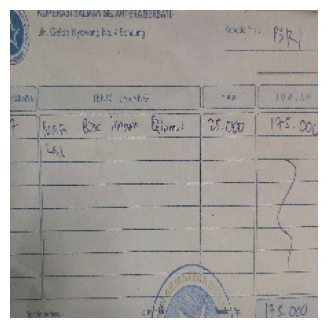

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

plt.figure(figsize=(4, 4))
dataset_iterator = train_dataset.as_numpy_iterator()  # Convert to iterator
x_train, y_train = next(dataset_iterator)  # Get next batch
image = x_train[np.random.choice(range(x_train.shape[0]))]
plt.imshow(image.astype("uint8"))
plt.axis("off")
plt.show()

In [ ]:
import tensorflow as tf

model = tf.keras.Sequential([
    # Input layer dengan normalisasi gambar
    tf.keras.Input(shape=(224, 224, 3)),
    tf.keras.layers.Rescaling(1.0 / 255),  # Normalisasi gambar ke range [0, 1]

    # Lapisan konvolusi dan pooling
    tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2, 2),

    tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2, 2),

    # Flatten untuk melanjutkan ke lapisan fully connected
    tf.keras.layers.Flatten(),

    # Fully connected layer dengan regularisasi L2
    #tf.keras.layers.Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.L2(0.01)),
    tf.keras.layers.Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.L2(0.01)),

    # Dropout layer untuk mengurangi overfitting
    tf.keras.layers.Dropout(0.5),  # Mematikan 50% neuron di lapisan ini

    # Output layer untuk 2 kelas: valid dan blur
    tf.keras.layers.Dense(1, activation='sigmoid')
])

model.compile(
    optimizer=Adam(learning_rate=0.001),  # Atur learning rate
    loss='binary_crossentropy',          # Karena klasifikasi biner
    metrics=['accuracy']
)

model.summary()


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ rescaling_3 (Rescaling)              │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_8 (Conv2D)                    │ (None, 222, 222, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_8 (MaxPooling2D)       │ (None, 111, 111, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_9 (Conv2D)                    │ (None, 109, 109, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_9 (MaxPooling2D)       │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 186624)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ (None, 256)                 │      47,776,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ (None, 1)                   │             257 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 47,814,977 (182.40 MB)

 Trainable params: 47,814,977 (182.40 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
history = model.fit(
    train_dataset,
    epochs=10,
    validation_data=validation_dataset,
)

Epoch 1/10
39/39 ━━━━━━━━━━━━━━━━━━━━ 37s 787ms/step - accuracy: 0.5770 - loss: 5.3323 - val_accuracy: 0.8811 - val_loss: 1.5372
Epoch 2/10
39/39 ━━━━━━━━━━━━━━━━━━━━ 22s 552ms/step - accuracy: 0.8776 - loss: 1.2017 - val_accuracy: 0.8864 - val_loss: 0.9015
Epoch 3/10
39/39 ━━━━━━━━━━━━━━━━━━━━ 41s 553ms/step - accuracy: 0.9134 - loss: 0.8493 - val_accuracy: 0.8252 - val_loss: 0.7913
Epoch 4/10
39/39 ━━━━━━━━━━━━━━━━━━━━ 23s 583ms/step - accuracy: 0.9191 - loss: 0.6150 - val_accuracy: 0.9143 - val_loss: 0.5161
Epoch 5/10
39/39 ━━━━━━━━━━━━━━━━━━━━ 41s 579ms/step - accuracy: 0.9163 - loss: 0.5365 - val_accuracy: 0.9178 - val_loss: 0.4910
Epoch 6/10
39/39 ━━━━━━━━━━━━━━━━━━━━ 27s 710ms/step - accuracy: 0.9414 - loss: 0.4288 - val_accuracy: 0.9336 - val_loss: 0.5149
Epoch 7/10
39/39 ━━━━━━━━━━━━━━━━━━━━ 35s 544ms/step - accuracy: 0.9577 - loss: 0.4117 - val_accuracy: 0.9476 - val_loss: 0.3073
Epoch 8/10
39/39 ━━━━━━━━━━━━━━━━━━━━ 46s 684ms/step - accuracy: 0.9416 - loss: 0.3585 - val_accu

In [ ]:
# Menyimpan model ke file .h5
model.save('/content/drive/MyDrive/Capstone/model_cnn_crop_banyak_layer.h5')

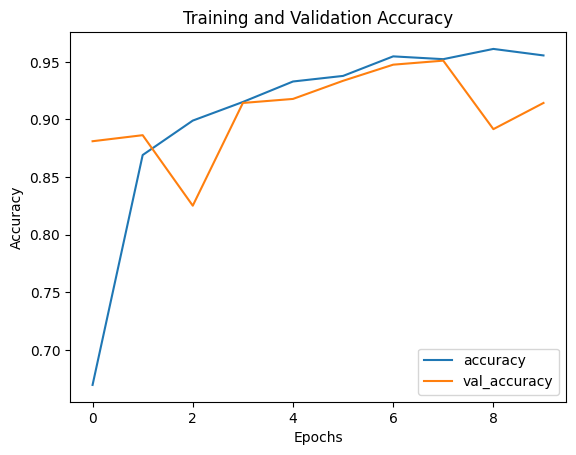

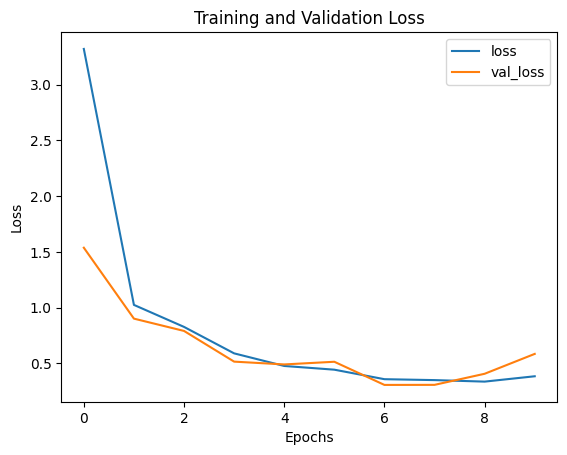

In [ ]:
import matplotlib.pyplot as plt

# Plot akurasi pelatihan dan validasi
plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label = 'val_accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')
plt.show()

# Plot kehilangan pelatihan dan validasi
plt.plot(history.history['loss'], label='loss')
plt.plot(history.history['val_loss'], label = 'val_loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()


Found 572 images belonging to 2 classes.


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


18/18 ━━━━━━━━━━━━━━━━━━━━ 7s 388ms/step


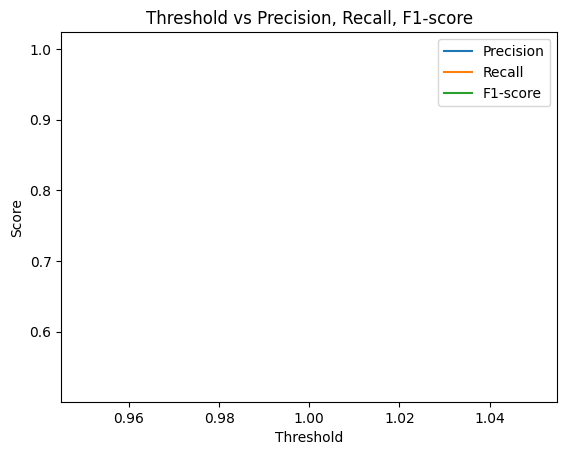

Optimal threshold: 1.0


In [ ]:
#Mencari Optimal Threshold
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import numpy as np
from sklearn.metrics import precision_recall_curve
import matplotlib.pyplot as plt


# Memuat model yang sudah dilatih (sesuaikan dengan path model Anda)
model = load_model('/content/drive/MyDrive/Capstone/model_cnn_crop_banyak_layer.h5')  # Gantilah dengan path model Anda

# Definisikan ImageDataGenerator untuk memuat dataset validasi
datagen = ImageDataGenerator(rescale=1./255)

validation_generator = datagen.flow_from_directory(
    '/content/drive/MyDrive/Capstone/cnn_crop_again/val',
    target_size=(224, 224),  # Sesuaikan dengan ukuran input model
    batch_size=32,
    class_mode='binary',  # Pastikan ini sesuai dengan jenis klasifikasi (binary)
    shuffle=False)  # Agar urutan prediksi dan label tetap sesuai

# Mendapatkan label sebenarnya (y_true)
y_true = validation_generator.classes  # Ini adalah label asli dari dataset

# Mendapatkan prediksi probabilitas
predictions = model.predict(validation_generator, verbose=1)

# Menghitung precision, recall, dan thresholds
precision, recall, thresholds = precision_recall_curve(y_true, predictions)

# Menghitung F1-score untuk setiap threshold
f1_scores = 2 * (precision * recall) / (precision + recall)

# Menampilkan hasil
plt.plot(thresholds, precision[:-1], label='Precision')
plt.plot(thresholds, recall[:-1], label='Recall')
plt.plot(thresholds, f1_scores[:-1], label='F1-score')
plt.xlabel('Threshold')
plt.ylabel('Score')
plt.legend()
plt.title('Threshold vs Precision, Recall, F1-score')
plt.show()

# Cari threshold dengan F1-score terbaik
best_threshold = thresholds[np.argmax(f1_scores)]
print(f'Optimal threshold: {best_threshold}')

In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing import image
import numpy as np
import os

# Memuat model yang telah disimpan
model = tf.keras.models.load_model('/content/drive/MyDrive/Capstone/model_cnn_cropbanyak_again.h5')

# Fungsi untuk memuat dan memproses gambar baru
def load_and_preprocess_image(img_path):
    # Memuat gambar dan mengubah ukurannya sesuai dengan ukuran input model
    img = image.load_img(img_path, target_size=(224, 224))

    # Mengubah gambar menjadi array
    img_array = image.img_to_array(img)

    # Menambahkan dimensi batch
    img_array = np.expand_dims(img_array, axis=0)

    # Normalisasi gambar ke rentang [0, 1]
    img_array = img_array / 255.0

    return img_array

# Fungsi untuk melakukan prediksi
def predict_image_class(img_path):
    img_array = load_and_preprocess_image(img_path)

    # Melakukan prediksi
    predictions = model.predict(img_array)

    # Mengonversi probabilitas
    predicted_class = (predictions < 0.998701572 ).astype("int32")

    # Menampilkan hasil prediksi
    if predicted_class == 0:
        print(f"The image is classified as 'Valid'.")
    else:
        print(f"The image is classified as 'Crop'.")
    print(predictions)

# Path ke gambar yang ingin diuji
#img_path = '/content/drive/MyDrive/Capstone/data_testing/valid/valid 2.jpg'  # Ganti dengan path gambar Anda yang ingin diuji

# Melakukan prediksi
#predict_image_class(img_path)

Testing image: WhatsApp Image 2024-11-30 at 14.03.23.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
The image is classified as 'Crop'.
[[0.99868196]]


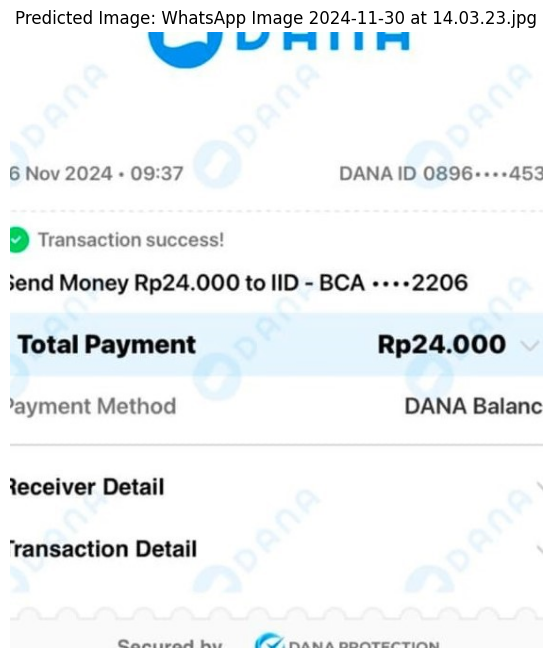

Testing image: WhatsApp Image 2024-11-30 at 14.03.04.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
The image is classified as 'Crop'.
[[0.9986903]]


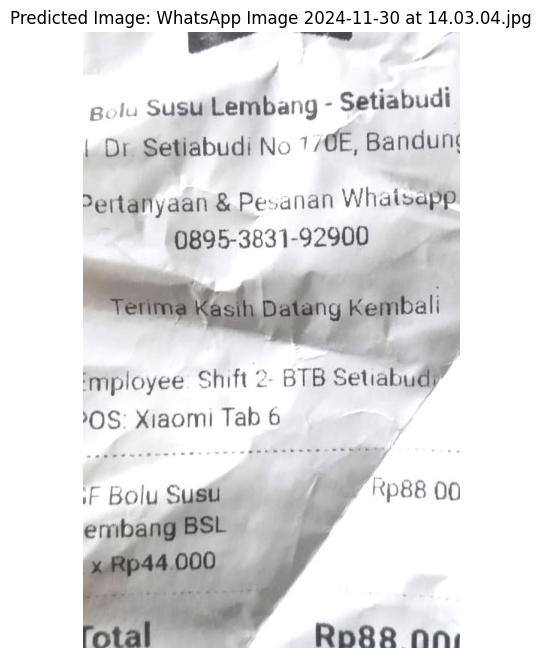

Testing image: WhatsApp Image 2024-11-30 at 14.03.12.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
The image is classified as 'Crop'.
[[0.9986922]]


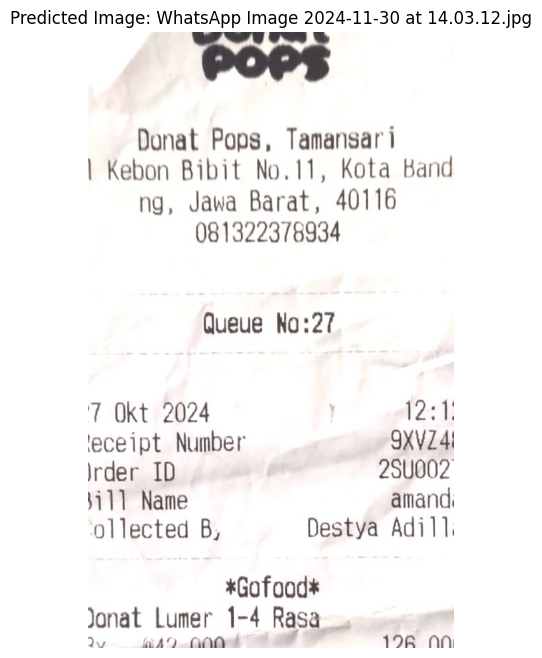

Testing image: valid 1 (1).jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
The image is classified as 'Valid'.
[[0.9987086]]


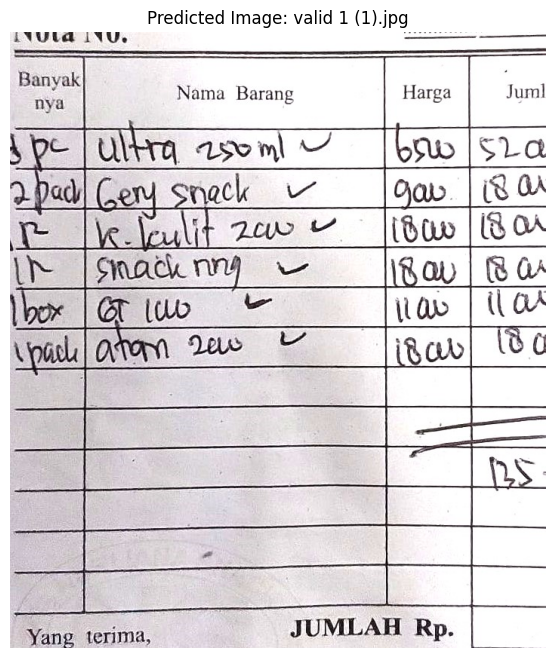

Testing image: valid 2.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
The image is classified as 'Crop'.
[[0.998698]]


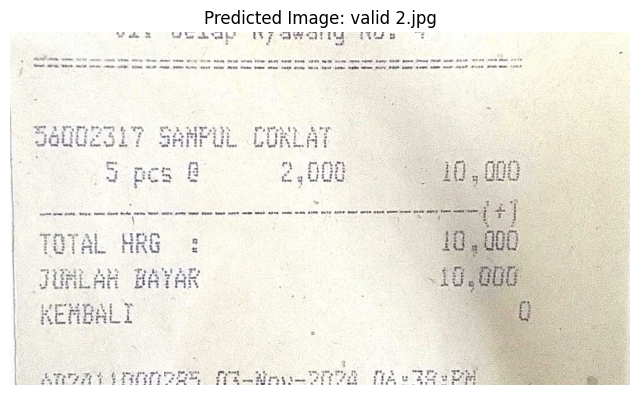

Testing image: WhatsApp Image 2024-12-02 at 23.58.35 (1).jpeg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
The image is classified as 'Crop'.
[[0.9986904]]


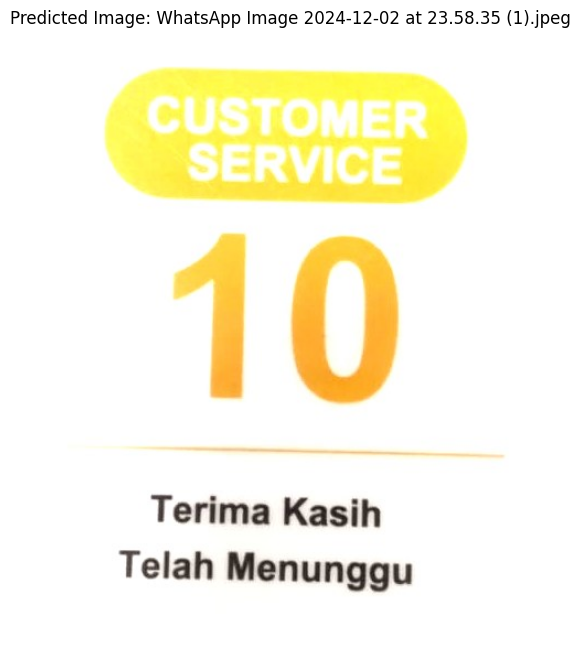

Testing image: WhatsApp Image 2024-12-02 at 23.58.35.jpeg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
The image is classified as 'Crop'.
[[0.9986926]]


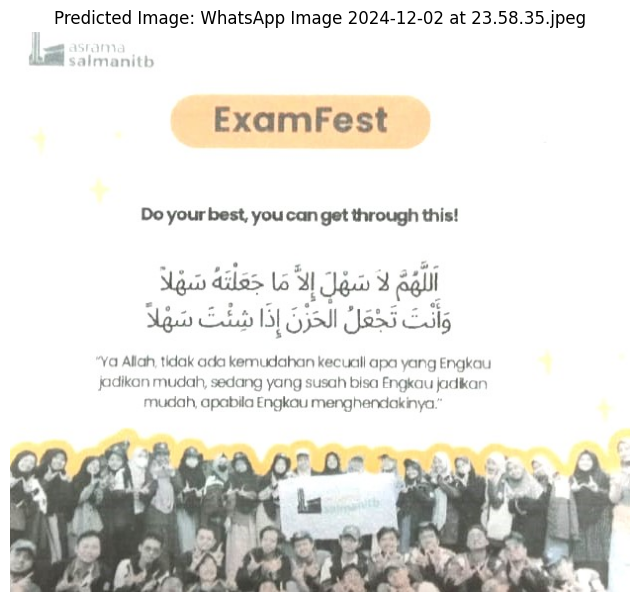

Testing image: WhatsApp Image 2024-12-02 at 23.58.34 (2).jpeg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
The image is classified as 'Crop'.
[[0.9986808]]


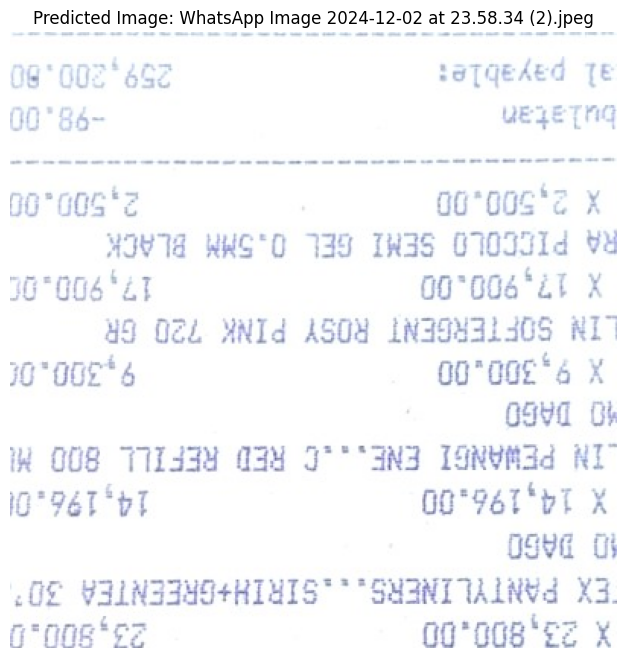

Testing image: WhatsApp Image 2024-12-02 at 23.58.34 (1).jpeg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
The image is classified as 'Crop'.
[[0.9986872]]


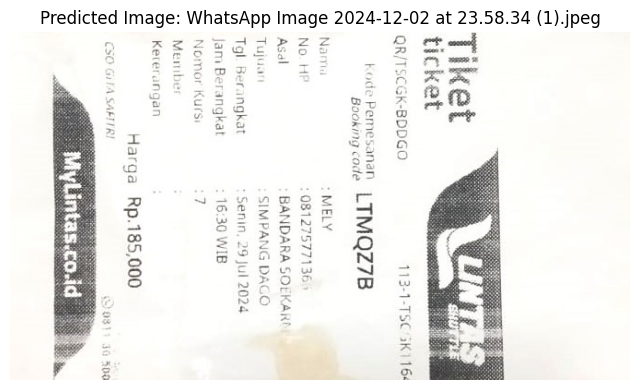

Testing image: WhatsApp Image 2024-12-02 at 23.58.34.jpeg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
The image is classified as 'Crop'.
[[0.99866676]]


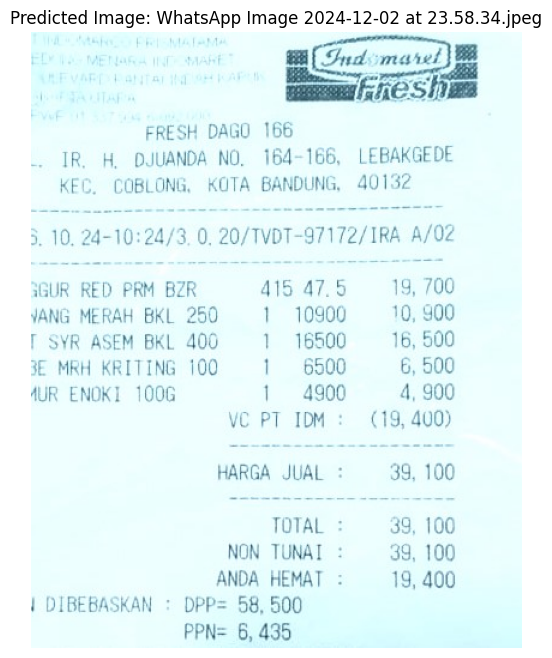

In [ ]:
import os
import cv2
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
import numpy as np

#TESTING MULTIPLE IMAGES
# Fungsi untuk menguji semua gambar dalam folder

def test_and_display_images_in_folder(folder_path):
    for filename in os.listdir(folder_path):
        if filename.endswith(('.jpg', '.png', '.jpeg')):  # Pastikan hanya memproses file gambar
            img_path = os.path.join(folder_path, filename)
            print(f"Testing image: {filename}")
            predict_image_class(img_path)

            # Membaca gambar
            image = cv2.imread(img_path)
            image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Mengonversi ke RGB untuk tampilan yang benar

            # Tampilkan gambar menggunakan matplotlib
            plt.figure(figsize=(8, 8))
            plt.imshow(image_rgb)
            plt.title(f"Predicted Image: {os.path.basename(img_path)}")  # Judul gambar dengan nama file
            plt.axis('off')  # Menyembunyikan axis
            plt.show()

# Folder tempat gambar yang ingin diuji
#test_folder = '/content/drive/MyDrive/Capstone/data_testing/valid'  #kontras kertas dgn background
test_folder = '/content/drive/MyDrive/Capstone/data_testing/crop'  #terang dan sama warna keseluruhannya
# Melakukan testing pada semua gambar dalam folder
test_and_display_images_in_folder(test_folder)

# Crop Aug Data

In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Direktori dataset
train_dir = '/content/drive/MyDrive/Capstone/data/train'
test_dir = '/content/drive/MyDrive/Capstone/data/val'

train_dataset = tf.keras.utils.image_dataset_from_directory(
    train_dir,
    image_size=(224, 224),  # Ukuran gambar
    batch_size=32  # Ukuran batch
)

validation_dataset = tf.keras.utils.image_dataset_from_directory(
    test_dir,
    image_size=(224, 224),  # Ukuran gambar
    batch_size=32  # Ukuran batch
)

Found 1572 files belonging to 2 classes.
Found 298 files belonging to 2 classes.


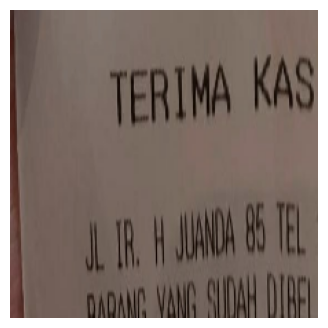

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

plt.figure(figsize=(4, 4))
train_iterator = iter(train_dataset)
x_train, y_train = next(train_iterator)
image = x_train[np.random.choice(range(x_train.shape[0]))]
plt.imshow(image.numpy().astype("uint8"))
plt.axis("off")
plt.show()

In [ ]:
import tensorflow as tf

model = tf.keras.Sequential([
    # Input layer dengan normalisasi gambar
    tf.keras.Input(shape=(224, 224, 3)),
    tf.keras.layers.Rescaling(1.0 / 255),  # Normalisasi gambar ke range [0, 1]

    # Lapisan konvolusi dan pooling
    tf.keras.layers.Conv2D(32, (3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2, 2),

    tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2, 2),

    # Flatten untuk melanjutkan ke lapisan fully connected
    tf.keras.layers.Flatten(),

    # Fully connected layer dengan regularisasi L2
    #tf.keras.layers.Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.L2(0.01)),
    tf.keras.layers.Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.L2(0.01)),

    # Dropout layer untuk mengurangi overfitting
    tf.keras.layers.Dropout(0.5),  # Mematikan 50% neuron di lapisan ini

    # Output layer untuk 2 kelas: valid dan blur
    tf.keras.layers.Dense(1, activation='sigmoid')
])

model.compile(
    optimizer=Adam(learning_rate=0.001),  # Atur learning rate
    loss='binary_crossentropy',          # Karena klasifikasi biner
    metrics=['accuracy']
)

model.summary()


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ rescaling (Rescaling)                │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 186624)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 256)                 │      47,776,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │             257 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 47,795,649 (182.33 MB)

 Trainable params: 47,795,649 (182.33 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
history = model.fit(
    train_dataset,
    epochs=20,
    validation_data=validation_dataset,
)

Epoch 1/20
50/50 ━━━━━━━━━━━━━━━━━━━━ 250s 5s/step - accuracy: 0.5226 - loss: 7.2648 - val_accuracy: 0.5302 - val_loss: 1.4463
Epoch 2/20
50/50 ━━━━━━━━━━━━━━━━━━━━ 252s 5s/step - accuracy: 0.6110 - loss: 1.2572 - val_accuracy: 0.5973 - val_loss: 0.9383
Epoch 3/20
50/50 ━━━━━━━━━━━━━━━━━━━━ 262s 5s/step - accuracy: 0.6784 - loss: 0.9246 - val_accuracy: 0.6242 - val_loss: 1.0107
Epoch 4/20
50/50 ━━━━━━━━━━━━━━━━━━━━ 276s 5s/step - accuracy: 0.6791 - loss: 0.9319 - val_accuracy: 0.7181 - val_loss: 0.8937
Epoch 5/20
50/50 ━━━━━━━━━━━━━━━━━━━━ 250s 5s/step - accuracy: 0.7722 - loss: 0.8699 - val_accuracy: 0.7248 - val_loss: 0.8562
Epoch 6/20
50/50 ━━━━━━━━━━━━━━━━━━━━ 281s 5s/step - accuracy: 0.7879 - loss: 0.8381 - val_accuracy: 0.8322 - val_loss: 0.7064
Epoch 7/20
50/50 ━━━━━━━━━━━━━━━━━━━━ 244s 5s/step - accuracy: 0.8147 - loss: 0.7698 - val_accuracy: 0.8658 - val_loss: 0.6164
Epoch 8/20
50/50 ━━━━━━━━━━━━━━━━━━━━ 251s 5s/step - accuracy: 0.8550 - loss: 0.7198 - val_accuracy: 0.8456 - v

In [ ]:
# Mengevaluasi model pada data pengujian
test_loss, test_acc = model.evaluate(validation_dataset)
print(f"Test Accuracy: {test_acc}")
print(f"Test Loss: {test_loss}")

In [ ]:
# Menyimpan model ke file .h5
model.save('/content/drive/MyDrive/Capstone/model_cnn_crop1.h5')


In [ ]:
import matplotlib.pyplot as plt

# Plot akurasi pelatihan dan validasi
plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label = 'val_accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')
plt.show()

# Plot kehilangan pelatihan dan validasi
plt.plot(history.history['loss'], label='loss')
plt.plot(history.history['val_loss'], label = 'val_loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()


In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing import image
import numpy as np
import os

# Memuat model yang telah disimpan
model = tf.keras.models.load_model('/content/drive/MyDrive/Capstone/model_cnn_crop.h5')

# Fungsi untuk memuat dan memproses gambar baru
def load_and_preprocess_image(img_path):
    # Memuat gambar dan mengubah ukurannya sesuai dengan ukuran input model
    img = image.load_img(img_path, target_size=(224, 224))

    # Mengubah gambar menjadi array
    img_array = image.img_to_array(img)

    # Menambahkan dimensi batch
    img_array = np.expand_dims(img_array, axis=0)

    # Normalisasi gambar ke rentang [0, 1]
    img_array = img_array / 255.0

    return img_array

# Fungsi untuk melakukan prediksi
def predict_image_class(img_path):
    img_array = load_and_preprocess_image(img_path)

    # Melakukan prediksi
    predictions = model.predict(img_array)

    # Mengonversi probabilitas ke kelas (0: valid, 1: rotated)
    predicted_class = (predictions < 0.5 ).astype("int32")

    # Menampilkan hasil prediksi
    if predicted_class == 0:
        print(f"The image is classified as 'Valid'.")
    else:
        print(f"The image is classified as 'Crop'.")
    print(predictions)

# Path ke gambar yang ingin diuji
#img_path = '/content/drive/MyDrive/Capstone/data_testing/valid/valid 2.jpg'  # Ganti dengan path gambar Anda yang ingin diuji

# Melakukan prediksi
#predict_image_class(img_path)

In [ ]:
#TESTING MULTIPLE IMAGES
# Fungsi untuk menguji semua gambar dalam folder
def test_images_in_folder(folder_path):
    for filename in os.listdir(folder_path):
        if filename.endswith(('.jpg', '.png', '.jpeg')):  # Pastikan hanya memproses file gambar
            img_path = os.path.join(folder_path, filename)
            print(f"Testing image: {filename}")
            predict_image_class(img_path)

# Folder tempat gambar yang ingin diuji
#test_folder = '/content/drive/MyDrive/Capstone/data_testing/valid'  # Ganti dengan path folder Anda
test_folder = '/content/drive/MyDrive/Capstone/data_testing/crop'
# Melakukan testing pada semua gambar dalam folder
test_images_in_folder(test_folder)

# CNN TL x OCR

In [ ]:
!apt-get update
!apt-get install -y tesseract-ocr

Get:1 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease [3,626 B]
Hit:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease
Get:3 http://security.ubuntu.com/ubuntu jammy-security InRelease [129 kB]
Get:4 https://r2u.stat.illinois.edu/ubuntu jammy InRelease [6,555 B]
Hit:5 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:6 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [128 kB]
Get:7 https://r2u.stat.illinois.edu/ubuntu jammy/main amd64 Packages [2,621 kB]
Hit:8 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Get:9 http://security.ubuntu.com/ubuntu jammy-security/universe amd64 Packages [1,224 kB]
Hit:10 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Hit:11 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease
Get:12 https://r2u.stat.illinois.edu/ubuntu jammy/main all Packages [8,514 kB]
Get:13 http://security.ubuntu.com/ubuntu jammy-security/main amd64

In [ ]:
!pip install pytesseract

In [ ]:
pip install tensorflow keras opencv-python-headless pytesseract

In [ ]:
import os
import numpy as np
import cv2
import pytesseract
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Flatten, Concatenate, Input
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Path dataset
train_dir = '/content/drive/MyDrive/Capstone/dataset/train'
test_dir = '/content/drive/MyDrive/Capstone/dataset/val'

In [ ]:
# Fungsi untuk memproses gambar
from PIL import Image

def preprocess_image(image_path, target_size=(224, 224)):
    try:
        with Image.open(image_path) as img:
            img = img.resize(target_size)
            img = np.array(img) / 255.0  # Normalisasi
        # Pastikan gambar memiliki 3 channel (RGB)
        if len(img.shape) == 2:  # Jika grayscale, konversi ke RGB
            img = np.stack((img,)*3, axis=-1)
        elif img.shape[-1] != 3:  # Abaikan gambar dengan channel tidak valid
            print(f"Invalid channel in image {image_path}, skipping.")
            return None
        return img
    except Exception as e:
        print(f"Error processing image {image_path}: {e}")
        return None

# Fungsi untuk mendapatkan fitur OCR
def extract_ocr_features(image_path):
    image = cv2.imread(image_path)
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    text = pytesseract.image_to_string(gray)
    boxes = pytesseract.image_to_boxes(gray)

    # Fitur sederhana: jumlah karakter & rasio bounding box dekat tepi
    num_chars = len(text)
    edge_ratio = sum(
        1 for b in boxes.splitlines()
        if int(b.split()[1]) < 10 or int(b.split()[3]) > (image.shape[1] - 10)
    ) / max(len(boxes.splitlines()), 1)

    return np.array([num_chars, edge_ratio])


In [ ]:
def load_dataset_with_validation(dataset_dir, target_size=(224, 224)):
    image_paths = []
    labels = []
    total_valid = 0
    class_counts = {}

    for label, class_name in enumerate(['valid', 'crop']):
        class_dir = os.path.join(dataset_dir, class_name)
        valid_count = 0
        for img_file in os.listdir(class_dir):
            img_path = os.path.join(class_dir, img_file)
            if not img_file.lower().endswith(('.png', '.jpg', '.jpeg')):
                print(f"Skipped non-image file: {img_path}")
                continue
            img = preprocess_image(img_path, target_size)
            if img is not None:
                image_paths.append(img_path)
                labels.append(label)
                valid_count += 1
            else:
                print(f"Invalid or corrupted image: {img_path}")
        total_valid += valid_count
        class_counts[class_name] = valid_count

    print(f"\nSummary:")
    for class_name, count in class_counts.items():
        print(f"  - {class_name}: {count} valid images")
    print(f"Total valid images: {total_valid}\n")

    return image_paths, labels


In [ ]:
# Load dataset train dan test
train_image_paths, train_labels = load_dataset_with_validation(train_dir)
test_image_paths, test_labels = load_dataset_with_validation(test_dir)

# Buat fitur CNN dan OCR
train_cnn_features = np.array([preprocess_image(path) for path in train_image_paths])
train_ocr_features = np.array([extract_ocr_features(path) for path in train_image_paths])
test_cnn_features = np.array([preprocess_image(path) for path in test_image_paths])
test_ocr_features = np.array([extract_ocr_features(path) for path in test_image_paths])

# Konversi label ke numpy array
train_labels = np.array(train_labels)
test_labels = np.array(test_labels)


Invalid channel in image /content/drive/MyDrive/Capstone/dataset/train/valid/Valid 63.png, skipping.
Invalid or corrupted image: /content/drive/MyDrive/Capstone/dataset/train/valid/Valid 63.png
Invalid channel in image /content/drive/MyDrive/Capstone/dataset/train/valid/Valid 52.png, skipping.
Invalid or corrupted image: /content/drive/MyDrive/Capstone/dataset/train/valid/Valid 52.png
Invalid channel in image /content/drive/MyDrive/Capstone/dataset/train/valid/Valid 72.png, skipping.
Invalid or corrupted image: /content/drive/MyDrive/Capstone/dataset/train/valid/Valid 72.png
Invalid channel in image /content/drive/MyDrive/Capstone/dataset/train/valid/Valid 123s.png, skipping.
Invalid or corrupted image: /content/drive/MyDrive/Capstone/dataset/train/valid/Valid 123s.png
Invalid channel in image /content/drive/MyDrive/Capstone/dataset/train/valid/Valid 53.png, skipping.
Invalid or corrupted image: /content/drive/MyDrive/Capstone/dataset/train/valid/Valid 53.png
Skipped non-image file: /c

In [ ]:
# Input untuk gambar dan fitur OCR
image_input = Input(shape=(224, 224, 3), name='image_input')
ocr_input = Input(shape=(2,), name='ocr_input')

# CNN Backbone (ResNet50 pretrained)
resnet = ResNet50(weights='imagenet', include_top=False, input_tensor=image_input)
x = Flatten()(resnet.output)
x = Dense(128, activation='relu')(x)

# Gabungkan dengan OCR features
combined = Concatenate()([x, ocr_input])
x = Dense(64, activation='relu')(combined)
output = Dense(1, activation='sigmoid')(x)

# Model
model = Model(inputs=[image_input, ocr_input], outputs=output)
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

model.summary()

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ image_input (InputLayer)  │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_pad (ZeroPadding2D) │ (None, 230, 230, 3)    │              0 │ image_input[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 112, 112, 64)   │          9,472 │ conv1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, 112, 112, 64)   │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, 112, 112, 64)   │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pad (ZeroPadding2D) │ (None, 114, 114, 64)   │              0 │ conv1_relu[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pool (MaxPooling2D) │ (None, 56, 56, 64)     │              0 │ pool1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 56, 56, 64)     │          4,160 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 56, 56, 64)     │         36,928 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_2_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_2_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_conv       │ (None, 56, 56, 256)    │         16,640 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_3_conv       │ (None, 56, 56, 256)    │         16,640 │ conv2_block1_2_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├──────────────────────

 Total params: 36,441,345 (139.01 MB)

 Trainable params: 36,388,225 (138.81 MB)

 Non-trainable params: 53,120 (207.50 KB)

In [ ]:
history = model.fit(
    [train_cnn_features, train_ocr_features], train_labels,
    validation_data=([test_cnn_features, test_ocr_features], test_labels),
    epochs=10, batch_size=32
)

Epoch 1/10
 6/18 ━━━━━━━━━━━━━━━━━━━━ 5:15 26s/step - accuracy: 0.5938 - loss: 9.0021

In [ ]:
loss, accuracy = model.evaluate([test_cnn_features, test_ocr_features], test_labels)
print(f"Loss: {loss}, Accuracy: {accuracy}")

In [ ]:
import matplotlib.pyplot as plt

# Plot akurasi pelatihan dan validasi
plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label = 'val_accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')
plt.show()

# Plot kehilangan pelatihan dan validasi
plt.plot(history.history['loss'], label='loss')
plt.plot(history.history['val_loss'], label = 'val_loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()


#Transfer Learning

In [ ]:
import tensorflow as tf
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

In [ ]:
# Load EfficientNetB0 pre-trained model tanpa top layers
base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Membekukan lapisan pre-trained untuk menjaga bobot awal
base_model.trainable = False

16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [ ]:
# Custom model
x = base_model.output
x = GlobalAveragePooling2D()(x)  # Mengubah ke vektor 1D
x = Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.L2(0.01))(x)  # Fully connected layer
x = Dropout(0.5)(x)  # Dropout untuk mengurangi overfitting
predictions = Dense(1, activation='sigmoid')(x)  # Output layer binary

# Gabungkan base model dengan custom head
model = Model(inputs=base_model.input, outputs=predictions)

# Kompilasi model
model.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss='binary_crossentropy',
    metrics=['accuracy']
)

# Lihat arsitektur model
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ rescaling (Rescaling)     │ (None, 224, 224, 3)    │              0 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ normalization             │ (None, 224, 224, 3)    │              7 │ rescaling[0][0]        │
│ (Normalization)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ rescaling_1 (Rescaling)   │ (None, 224, 224, 3)    │              0 │ normalization[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_conv_pad             │ (None, 225, 225, 3)    │              0 │ rescaling_1[0][0]      │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_conv (Conv2D)        │ (None, 112, 112, 32)   │            864 │ stem_conv_pad[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_bn                   │ (None, 112, 112, 32)   │            128 │ stem_conv[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_activation           │ (None, 112, 112, 32)   │              0 │ stem_bn[0][0]          │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_dwconv            │ (None, 112, 112, 32)   │            288 │ stem_activation[0][0]  │
│ (DepthwiseConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_bn                │ (None, 112, 112, 32)   │            128 │ block1a_dwconv[0][0]   │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_activation        │ (None, 112, 112, 32)   │              0 │ block1a_bn[0][0]       │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_squeeze        │ (None, 32)             │              0 │ block1a_activation[0]… │
│ (GlobalAveragePooling2D)  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_reshape        │ (None, 1, 1, 32)       │              0 │ block1a_se_squeeze[0]… │
│ (Reshape)                 │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_reduce         │ (None, 1, 1, 8)        │            264 │ block1a_se_reshape[0]… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_expand    

 Total params: 4,377,764 (16.70 MB)

 Trainable params: 328,193 (1.25 MB)

 Non-trainable params: 4,049,571 (15.45 MB)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Direktori dataset
train_dir = '/content/drive/MyDrive/Capstone/dataset/train'
test_dir = '/content/drive/MyDrive/Capstone/dataset/val'

train_dataset = tf.keras.utils.image_dataset_from_directory(
    train_dir,
    image_size=(224, 224),  # Ukuran gambar
    batch_size=32  # Ukuran batch
)

validation_dataset = tf.keras.utils.image_dataset_from_directory(
    test_dir,
    image_size=(224, 224),  # Ukuran gambar
    batch_size=32  # Ukuran batch
)

Found 574 files belonging to 2 classes.
Found 60 files belonging to 2 classes.


In [ ]:
# Fine-tuning: Membuka beberapa lapisan atas untuk pelatihan
base_model.trainable = True
for layer in base_model.layers[:-30]:  # Membekukan sebagian besar layer
    layer.trainable = False

# Kompilasi ulang model dengan learning rate lebih rendah
model.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss='binary_crossentropy',
    metrics=['accuracy']
)

# Fine-tuning model
history_fine = model.fit(
    train_dataset,
    epochs=15,
    validation_data=validation_dataset
)

Epoch 1/15
18/18 ━━━━━━━━━━━━━━━━━━━━ 82s 3s/step - accuracy: 0.7086 - loss: 3.2517 - val_accuracy: 0.9000 - val_loss: 2.9152
Epoch 2/15
18/18 ━━━━━━━━━━━━━━━━━━━━ 79s 3s/step - accuracy: 0.8629 - loss: 3.0097 - val_accuracy: 0.8667 - val_loss: 2.7832
Epoch 3/15
18/18 ━━━━━━━━━━━━━━━━━━━━ 61s 3s/step - accuracy: 0.9069 - loss: 2.7961 - val_accuracy: 0.8667 - val_loss: 2.6565
Epoch 4/15
18/18 ━━━━━━━━━━━━━━━━━━━━ 87s 4s/step - accuracy: 0.9174 - loss: 2.6294 - val_accuracy: 0.8833 - val_loss: 2.5091
Epoch 5/15
18/18 ━━━━━━━━━━━━━━━━━━━━ 79s 3s/step - accuracy: 0.9378 - loss: 2.4647 - val_accuracy: 0.9167 - val_loss: 2.3734
Epoch 6/15
18/18 ━━━━━━━━━━━━━━━━━━━━ 67s 4s/step - accuracy: 0.9502 - loss: 2.3124 - val_accuracy: 0.9500 - val_loss: 2.2386
Epoch 7/15
18/18 ━━━━━━━━━━━━━━━━━━━━ 61s 3s/step - accuracy: 0.9637 - loss: 2.1691 - val_accuracy: 0.9333 - val_loss: 2.1140
Epoch 8/15
18/18 ━━━━━━━━━━━━━━━━━━━━ 87s 4s/step - accuracy: 0.9700 - loss: 2.0389 - val_accuracy: 0.9333 - val_loss:

In [ ]:
# Menyimpan model ke file .h5
model.save('/content/drive/MyDrive/Capstone/model_tf.h5')

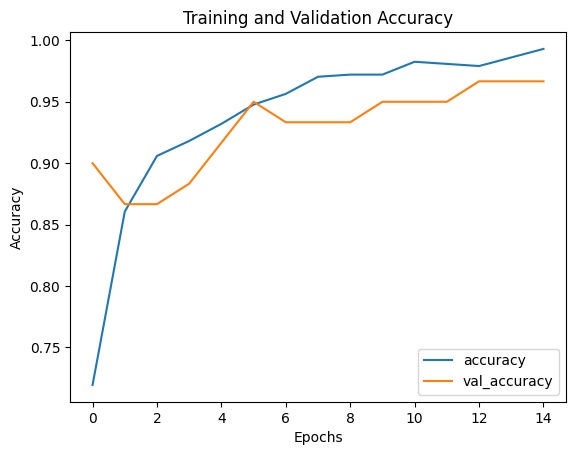

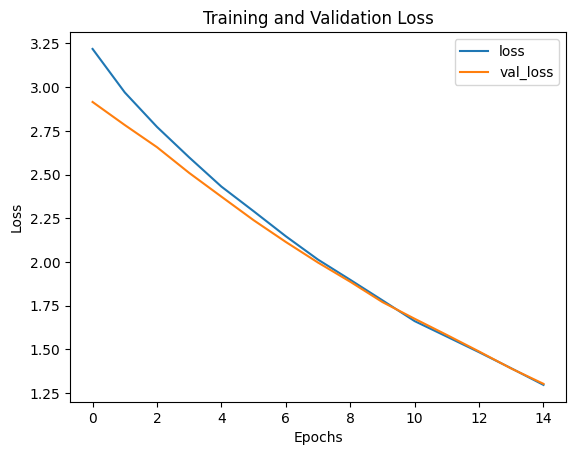

In [ ]:
import matplotlib.pyplot as plt

# Plot akurasi pelatihan dan validasi
plt.plot(history_fine.history['accuracy'], label='accuracy')
plt.plot(history_fine.history['val_accuracy'], label = 'val_accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')
plt.show()

# Plot kehilangan pelatihan dan validasi
plt.plot(history_fine.history['loss'], label='loss')
plt.plot(history_fine.history['val_loss'], label = 'val_loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [ ]:
# Mengevaluasi model pada data pengujian
test_loss, test_acc = model.evaluate(validation_dataset)
print(f"Test Accuracy: {test_acc}")
print(f"Test Loss: {test_loss}")

2/2 ━━━━━━━━━━━━━━━━━━━━ 10s 2s/step - accuracy: 0.9674 - loss: 1.3065
Test Accuracy: 0.9666666388511658
Test Loss: 1.302022099494934


In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing import image
import numpy as np
import os

# Memuat model yang telah disimpan
model = tf.keras.models.load_model('/content/drive/MyDrive/Capstone/model_tf.h5')

# Fungsi untuk memuat dan memproses gambar baru
def load_and_preprocess_image(img_path):
    # Memuat gambar dan mengubah ukurannya sesuai dengan ukuran input model
    img = image.load_img(img_path, target_size=(224, 224))

    # Mengubah gambar menjadi array
    img_array = image.img_to_array(img)

    # Menambahkan dimensi batch
    img_array = np.expand_dims(img_array, axis=0)

    # Normalisasi gambar ke rentang [0, 1]
    img_array = img_array / 255.0

    return img_array

# Fungsi untuk melakukan prediksi
def predict_image_class(img_path):
    img_array = load_and_preprocess_image(img_path)

    # Melakukan prediksi
    predictions = model.predict(img_array)

    # Mengonversi probabilitas ke kelas (0: valid, 1: rotated)
    predicted_class = (predictions < 0.5 ).astype("int32")

    # Menampilkan hasil prediksi
    if predicted_class == 0:
        print(f"The image is classified as 'Valid'.")
    else:
        print(f"The image is classified as 'Crop'.")
    print(predictions)

# Path ke gambar yang ingin diuji
#img_path = '/content/drive/MyDrive/Capstone/data_testing/valid/valid 2.jpg'  # Ganti dengan path gambar Anda yang ingin diuji

# Melakukan prediksi
#predict_image_class(img_path)

In [ ]:
#TESTING MULTIPLE IMAGES
# Fungsi untuk menguji semua gambar dalam folder
def test_images_in_folder(folder_path):
    for filename in os.listdir(folder_path):
        if filename.endswith(('.jpg', '.png', '.jpeg')):  # Pastikan hanya memproses file gambar
            img_path = os.path.join(folder_path, filename)
            print(f"Testing image: {filename}")
            predict_image_class(img_path)

# Folder tempat gambar yang ingin diuji
#test_folder = '/content/drive/MyDrive/Capstone/data_testing/valid'  # Ganti dengan path folder Anda
test_folder = '/content/drive/MyDrive/Capstone/data_testing/crop'
# Melakukan testing pada semua gambar dalam folder
test_images_in_folder(test_folder)

Testing image: valid 2.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step
The image is classified as 'Valid'.
[[0.7527903]]
Testing image: valid 1 (1).jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
The image is classified as 'Valid'.
[[0.7531966]]
Testing image: WhatsApp Image 2024-11-30 at 14.03.12.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
The image is classified as 'Valid'.
[[0.7532612]]
Testing image: WhatsApp Image 2024-11-30 at 14.03.04.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step
The image is classified as 'Valid'.
[[0.75262916]]
Testing image: WhatsApp Image 2024-11-30 at 14.03.23.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
The image is classified as 'Valid'.
[[0.7530619]]


In [ ]:
from tensorflow.keras.preprocessing import image
import numpy as np

# Membaca gambar baru
#img_path = '/content/drive/MyDrive/Capstone/dataset/train/crop/crop 2.jpg'
img_path = '/content/drive/MyDrive/Capstone/Cropped/crop_Batch 5_Bambu.jpg'
img = image.load_img(img_path, target_size=(224, 224))

# Mengubah gambar menjadi array
img_array = image.img_to_array(img)

# Menambahkan dimensi batch
img_array = np.expand_dims(img_array, axis=0)

# Normalisasi gambar
img_array = img_array

# Melakukan prediksi
predictions = model.predict(img_array)
#predicted_class = np.argmax(predictions, axis=1)
predicted_class = (predictions > 0.5).astype("int32")

# Menampilkan kelas yang diprediksi
print(f"Predicted Class: {predicted_class}")
print(predictions)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
Predicted Class: [[0]]
[[0.16169019]]


In [ ]:
# Membaca gambar baru
img_path = '/content/drive/MyDrive/Capstone/dataset/train/valid/valid 286.jpg'  # Ganti dengan path gambar Anda
img = image.load_img(img_path, target_size=(224, 224))

# Mengubah gambar menjadi array
img_array = image.img_to_array(img)

# Menambahkan dimensi batch
img_array = np.expand_dims(img_array, axis=0)

# Normalisasi gambar
img_array = img_array

# Melakukan prediksi
predictions = model.predict(img_array)
#predicted_class = np.argmax(predictions, axis=1)
predicted_class = (predictions > 0.5).astype("int32")

# Menampilkan kelas yang diprediksi
print(f"Predicted Class: {predicted_class}")
print(predictions)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
Predicted Class: [[1]]
[[0.9977765]]


# Transfer Learning II

In [ ]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
from matplotlib import pyplot as plt
import tensorflow as tf

print("Tensorflow version " + tf.__version__)
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))

Tensorflow version 2.17.1
Num GPUs Available:  0


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

def load_dataset_from_drive(batch_size: int, image_size: tuple = (224, 224)):
    # Path ke folder dataset di Google Drive
    base_dir = '/content/drive/MyDrive/Capstone/Dataset_CNN_Crop'  # Ganti dengan path folder dataset kamu

    # Membuat generator untuk data training dan validasi
    # Dengan validation_split=0.2, kita akan membagi dataset menjadi 80% training dan 20% validation
    train_datagen = ImageDataGenerator(validation_split=0.2)  # Rescale dan split dataset
    train_datagen = ImageDataGenerator(
    brightness_range=[0.7, 1.2],  # Mengubah kecerahan gambar
    fill_mode='nearest',
    validation_split=0.2
)

    # Data training (80% dari dataset)
    train_dataset = train_datagen.flow_from_directory(
        base_dir,
        target_size=image_size,
        batch_size=batch_size,
        class_mode='binary',  # Karena kita menggunakan Sparse Categorical Crossentropy
        subset='training'  # Subset untuk training
    )

    # Data validasi (20% dari dataset)
    validation_dataset = train_datagen.flow_from_directory(
        base_dir,
        target_size=image_size,
        batch_size=batch_size,
        class_mode='binary',
        subset='validation'  # Subset untuk validasi
    )

    # Cek jumlah sampel
    print(f"Number of training samples: {train_dataset.samples}")
    print(f"Number of validation samples: {validation_dataset.samples}")
    print(f"Number of classes: {train_dataset.num_classes}")

    return train_dataset, validation_dataset

# Memanggil fungsi dengan benar
train_dataset, val_dataset = load_dataset_from_drive(batch_size=64, image_size=(224, 224))

Found 508 images belonging to 2 classes.
Found 126 images belonging to 2 classes.
Number of training samples: 508
Number of validation samples: 126
Number of classes: 2


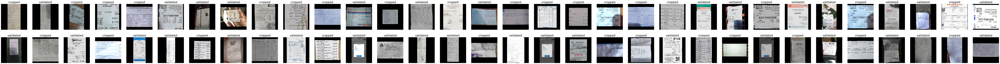

In [ ]:
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np

# Plot multiple images
def plot_multiple_images(images_batch, n=64):
    n_cols = n // 2  # Set number of columns in the plot
    n_rows = 2       # Set number of rows in the plot
    plt.figure(figsize=(4*n_cols, 4*n_rows))

    images, labels = images_batch  # Unpack images and labels from the batch

    for i in range(n):
        index = i  # For simplicity, just using index as is
        image = tf.expand_dims(images[index], 0).numpy()  # Convert image to numpy array
        image = np.squeeze(image, axis=0)  # Remove extra dimension
        label = labels[index]

        # Normalize the image if necessary
        # Check if the image values are within the expected range for display (0-1 for floats or 0-255 for integers)
        if image.max() > 1.0:
            image = image / 255.0  # Rescale to [0, 1] if the values are in [0, 255]

        # Assign a title based on the label
        if label == 0:
            title = 'cropped'
        else:
            title = 'validated'

        # Plot the image in the respective subplot
        plt.subplot(n_rows, n_cols, i + 1)
        plt.title(title, fontsize=20, color='black')
        plt.imshow(image)
        plt.axis("off")

    plt.show()

# Assuming train_dataset is the generator returned from load_dataset_from_drive
BATCH_SIZE = 64
plot_multiple_images(next(train_dataset))  # Use next to get a batch from the generator


Learning rate schedule: 1e-05 to 5e-05 to 1.11e-05


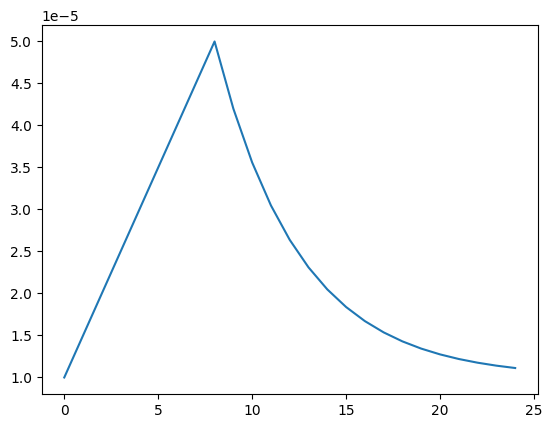

In [ ]:
# create learning rate schedule

EPOCHS = 25

LR_START = 0.00001
LR_MAX = 0.00005
LR_MIN = 0.00001
LR_RAMPUP_EPOCHS = 8
LR_SUSTAIN_EPOCHS = 0
LR_EXP_DECAY = .8

@tf.function
def lrfn(epoch):
    if epoch < LR_RAMPUP_EPOCHS:
        lr = (LR_MAX - LR_START) / LR_RAMPUP_EPOCHS * epoch + LR_START
    elif epoch < LR_RAMPUP_EPOCHS + LR_SUSTAIN_EPOCHS:
        lr = LR_MAX
    else:
        lr = (LR_MAX - LR_MIN) * LR_EXP_DECAY**(epoch - LR_RAMPUP_EPOCHS - LR_SUSTAIN_EPOCHS) + LR_MIN
    return lr

rng = [i for i in range(EPOCHS)]
y = [lrfn(x) for x in rng]
plt.plot(rng, y)
print("Learning rate schedule: {:.3g} to {:.3g} to {:.3g}".format(y[0], max(y), y[-1]))

In [ ]:
def display_training_curves(training, validation, title, subplot):
    if subplot%10==1:
        plt.subplots(figsize=(10,10), facecolor='#F0F0F0')
        plt.tight_layout()
    ax = plt.subplot(subplot)
    ax.set_facecolor('#F8F8F8')
    ax.plot(training)
    ax.plot(validation)
    ax.set_title('model '+ title)
    ax.set_ylabel(title)
    ax.set_xlabel('epoch')
    ax.legend(['train', 'valid.'])

In [ ]:
# We will use pretrained Xception network as basis for our classifier.
# Later, I tested the ResNet50 and InceptionV3 architectures, the Xception network showed the best result.

BATCH_SIZE = 64
IMAGE_SIZE = [224, 224]

pretrained_model_1 = tf.keras.applications.Xception(weights='imagenet', include_top=False ,input_shape=[*IMAGE_SIZE, 3])
pretrained_model_1.trainable = True

model_1 = tf.keras.Sequential([pretrained_model_1,
                               tf.keras.layers.GlobalAveragePooling2D(),
                               tf.keras.layers.Dense(1, activation='sigmoid')])

model_1.compile(optimizer='adam', loss = 'binary_crossentropy', metrics=['accuracy'])


lr_callback = tf.keras.callbacks.LearningRateScheduler(lrfn, verbose=True)
earlystoping_callback = tf.keras.callbacks.EarlyStopping(patience=5, restore_best_weights=True,
                                                         monitor='val_accuracy', mode='auto')

83683744/83683744 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [ ]:
from keras.callbacks import LearningRateScheduler
def lr_schedule(epoch):
    initial_lr = 0.001
    drop_factor = 0.5
    epoch_drop = 10
    lr = initial_lr * (drop_factor ** (epoch // epoch_drop))
    return lr

lr_callback = LearningRateScheduler(lr_schedule)

In [ ]:
EPOCHS = 10
STEPS_PER_EPOCH = 192 // BATCH_SIZE

history_1 = model_1.fit(train_dataset, shuffle=True, steps_per_epoch=STEPS_PER_EPOCH,
                        epochs=EPOCHS,validation_data=val_dataset,
                        callbacks=[lr_callback, earlystoping_callback])

Epoch 1/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 262s 98s/step - accuracy: 0.9583 - loss: 0.1687 - val_accuracy: 0.5238 - val_loss: 5.9609 - learning_rate: 0.0010
Epoch 2/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 224s 79s/step - accuracy: 0.9518 - loss: 0.1194 - val_accuracy: 0.6032 - val_loss: 5.2691 - learning_rate: 0.0010
Epoch 3/10
2/3 ━━━━━━━━━━━━━━━━━━━━ 1:01 62s/step - accuracy: 0.9766 - loss: 0.0739

/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


3/3 ━━━━━━━━━━━━━━━━━━━━ 154s 46s/step - accuracy: 0.9792 - loss: 0.0673 - val_accuracy: 0.7381 - val_loss: 4.0041 - learning_rate: 0.0010
Epoch 4/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 256s 74s/step - accuracy: 0.9953 - loss: 0.0407 - val_accuracy: 0.7540 - val_loss: 3.3634 - learning_rate: 0.0010
Epoch 5/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 229s 83s/step - accuracy: 0.9544 - loss: 0.0921 - val_accuracy: 0.7381 - val_loss: 3.9280 - learning_rate: 0.0010
Epoch 6/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 155s 46s/step - accuracy: 0.9427 - loss: 0.1684 - val_accuracy: 0.7063 - val_loss: 5.2199 - learning_rate: 0.0010
Epoch 7/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 240s 75s/step - accuracy: 0.9953 - loss: 0.0542 - val_accuracy: 0.6270 - val_loss: 8.2621 - learning_rate: 0.0010
Epoch 8/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 227s 82s/step - accuracy: 0.9831 - loss: 0.0328 - val_accuracy: 0.6508 - val_loss: 6.4236 - learning_rate: 0.0010
Epoch 9/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 153s 46s/step - accuracy: 1.0000 - loss: 0.0243 - val_accuracy: 0.6746 - va